<a href="https://colab.research.google.com/github/JoyceQuintino/DataScience/blob/master/Lista_4_ML_Joyce_Quintino.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [2]:
class ClassificationMetrics:
    
    def accuracy(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
        result = ((y_real == y_predicted).sum() / y_real.shape[0])
        return result 
    
    def precision(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
        real = y_real.astype(bool)
        pred = y_predicted.astype(bool)
    
        T = real == 1
        F = ~T

        TP = pred[T].sum()
        FP = (~pred[F]).sum()

        result = (TP / (TP + FP))
        return result
    
    def recall(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
        real = y_real.astype(bool)
        pred = y_predicted.astype(bool)
        
        T = real == True
        TP = pred[T].sum()
        FN = (~pred[T]).sum()
        
        result = (TP / (TP + FN))
        return result
    
    def f1_score(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
        rec = ClassificationMetrics.recall(y_real, y_predicted)
        prec = ClassificationMetrics.precision(y_real, y_predicted)
        
        result = (2 * (rec * prec) / (rec + prec))
        return result

In [3]:
class UtilsFunctionData:
  def shuffle(X, y):
    y_size = y.shape[1]
    data = np.c_ [ X, y ]
    np.random.shuffle(data)
    X = data[:,:-y_size]
    y = data[:,-y_size:]
    return X, y
  
  def encode(count, label):
    encoded = np.zeros(count)
    encoded[int(label)] = 1
    return encoded

  def label_encoder(y):
    count = int(y.max() + 1)
    return np.array([  UtilsFunctionData.encode(count, label) for label in y ])
  
  def label_decoder(Y):
    return Y.argmax(axis=1)

In [4]:
class NormalizedData:
  def normalized(X, min, max):
    return (X - min) / (max - min)

  def unnormalized(X, min, max):
    return X * (max - min) + min
    
  def z_score(X):
    mean = X.mean()
    std = X.std()
    out = (X - mean) / std
    return out

In [5]:
class EvaluationErrorMetrics:
  def mse(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
    diff = (y_real - y_predicted) ** 2
    return np.mean(diff)

  def rmse(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
   diff = (y_real - y_predicted) ** 2
   return np.sqrt(diff.mean())
 
  def mae(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
    diff = (y_real - y_predicted)
    return np.mean(np.abs(diff))
 
  def mre(y_real: np.ndarray, y_predicted: np.ndarray) -> float:
    diff = (y_real - y_predicted)
    return np.mean(np.abs(diff))
    
  def cross_entropy(p: np.ndarray, q: np.ndarray) -> float:
    return -np.mean(np.sum(p * np.log(q), axis=1))

In [6]:
class Ativation_function:
  def sigmoid(x):
    return 1 / (1 + np.exp(-x))

  def sigmoid_deriv(x):
    return Ativation_function.sigmoid(x) - np.square(Ativation_function.sigmoid(x))

  def relu(x):
    return np.array([
      [max(0, i) for i in r]
      for r in x               
      ])

  def relu_deriv(x):
    x[x <= 0] = 0
    x[x > 0] = 1
    return x

  def tanh(x):
    return np.tanh(x)

  def tanh_deriv(x):
    return 1 - np.square(np.tanh(x))

  def softmax_vector(x):
    return np.exp(x) / np.exp(x).sum()

  def softmax(X):
    return np.array([ Ativation_function.softmax_vector(x) for x in X ])

  def softmax_deriv(X):
    return np.array([
        Ativation_function.softmax_vector(1 - Ativation_function.softmax_vector(x))
        for x in X               
    ])

In [7]:
class Perceptron:
  def __init__(self, neurons, features=0, activation_function=None):
    self.neurons = neurons
    self.weights = np.array([])
    self.features = features
    self.activation_function = activation_function
    self.delta = 0
    self.momentum = 0.01
  
  def generate_weights(n, m, factor, bias = 0):
    w = factor * np.random.normal(0, 1, (n, m))
    return np.c_[ np.zeros(n) + bias, w ]

  def init_weights(self, input_size):
    bias = 0.01 if self.activation_function == 'relu' else 0
    factor = np.sqrt(2 / input_size) if self.activation_function == 'relu' else np.sqrt(1 / input_size)
    self.weights = Perceptron.generate_weights(self.neurons,
                                               self.features,
                                               factor=factor,
                                               bias=bias)
    self.delta = np.zeros((self.neurons, self.features + 1))
    
  def activ_func(self, x):
    if self.activation_function == 'tanh':
      return Ativation_function.tanh(x)
    elif self.activation_function == 'relu':
      return Ativation_function.relu(x)
    elif self.activation_function == 'sigmoid':
      return Ativation_function.sigmoid(x)
    elif self.activation_function == 'softmax':
      return Ativation_function.softmax(x)
    else:
      return x

  def activ_func_deriv(self, x):
    if self.activation_function == 'tanh':
      return Ativation_function.tanh_deriv(x)
    elif self.activation_function == 'relu':
      return Ativation_function.relu_deriv(x)
    elif self.activation_function == 'sigmoid':
      return Ativation_function.sigmoid_deriv(x)
    elif self.activation_function == 'softmax':
      return Ativation_function.softmax_deriv(x)
    else:
      return np.ones(x.shape)
  
  def update(self, gradient):
    self.delta = self.momentum * self.delta - gradient
    self.weights = self.weights + self.delta

  def predict(self, X):
    return X @ self.weights.T

In [8]:
class MLP:
    def __init__(self,
                 alpha=0.01,
                 epochs=100,
                 momentum=0.75,
                 batch=50,
                 regularization=0.2,
                 layers=[],
                 task='classification',
                 cost_calc=10
                ):
        self.layers = [
            Perceptron(neurons=neurons, activation_function=activation_function)
            for neurons, activation_function in layers
        ]
        self.alpha = alpha
        self.epochs = int(epochs)
        self.features = None
        self.costs = []
        self.momentum = momentum
        self.batch = int(batch)
        self.regularization = regularization
        self.task = task
        self.cost_calc = cost_calc
        self.score = 0
        
        if task not in ['classification', 'regression']:
            raise Exception('Unknown task.')
            
    def init_layers_weights(self):
        for i, layer in enumerate(self.layers):
            if i == 0:
                layer.features = self.features
            else:
                layer.features = self.layers[i - 1].neurons
            layer.init_weights(input_size=self.features)
                
    def add_bias(self, X):
        n = X.shape[0]
        return np.c_[ np.ones(n), X ]
        
    #Atualiza os pesos da camada de saída
    def update_output_layer(self, output, y_real, input):
        output_layer = self.layers[-1]
        error = y_real - output_layer.activ_func(output)
        theta = -error
        gradient = theta.T @ input
        W = output_layer.weights
        output_layer.update(self.alpha * (gradient + self.regularization * W))
        return theta
    
    #Atualiza os pesos de uma camada interna
    def update_hidden_layer(self, layer, output, input, back_weights, previous):
        prev = layer.activ_func_deriv(output) * (previous @ back_weights[:,1:])
        gradient = prev.T @ input
        W = layer.weights
        layer.update(self.alpha * (gradient + self.regularization * W))
        return prev
        
    def calculate_cost(self):
        train_pred = self._predict(self.X_norm)
        if self.task == 'regression':
            cost = { 'train': EvaluationErrorMetrics.mse(self.y, train_pred) }
        else:
            Y = UtilsFunctionData.label_encoder(self.y)
            # O 10e-6 abaixo é um ruído para evitar erro na entropia cruzada quando log(0)
            cost = { 'train': EvaluationErrorMetrics.cross_entropy(train_pred, Y + 1e-6) }
            
        if self.has_validation:
            vali_pred = self._predict(self.vali_X_norm)
            if self.task == 'regression':
                self.score = EvaluationErrorMetrics.mse(self.vali_y, vali_pred)
            else:
                vali_Y = UtilsFunctionData.label_encoder(self.vali_y)
                self.score = EvaluationErrorMetrics.cross_entropy(vali_pred, vali_Y + 1e-6)
                
            cost['validation'] = self.score
        self.costs.append(cost)
            
    def _predict(self, X):
        u = X
        for layer in self.layers:
            y = layer.predict(self.add_bias(u))
            u = layer.activ_func(y)
                
        if self.task == 'classification':
            return u
        else:
            return NormalizedData.unnormalized(u, self.Y_min, self.Y_max).reshape(1, -1)[0]
            
    def add_layer(self, layer):
        self.layers.append(layer)
            
    def predict(self, X):
        X_norm = NormalizedData.normalized(X, self.X_min, self.X_max)
        pred = self._predict(X_norm)
        if self.task == 'classification':
            return UtilsFunctionData.label_decoder(pred)

        return pred
        
    def fit(self, X, y, vali_X=None, vali_y=None):
        self.has_validation = vali_X is not None and vali_y is not None
            
        self.y = y
        self.X = X
        self.X_min = X.min(axis=0)
        self.X_max = X.max(axis=0)
        self.X_norm = NormalizedData.normalized(X, self.X_min, self.X_max)
            
        if self.has_validation:
            self.vali_y = vali_y
            self.vali_X = vali_X
            self.vali_X_norm = NormalizedData.normalized(vali_X, self.X_min, self.X_max)
                
        self.costs = []
        self.features = X.shape[1]
        self.init_layers_weights()
            
        if self.task == 'classification':
            Y = UtilsFunctionData.label_encoder(y)
        else:
            # Normalização para regressão
            Y = y.reshape(1, -1).T
            self.Y_min = Y.min(axis=0)
            self.Y_max = Y.max(axis=0)
            Y = NormalizedData.normalized(Y, self.Y_min, self.Y_max)
                
        X_norm = self.X_norm
        for i in range(self.epochs):
            X_norm, Y = UtilsFunctionData.shuffle(X_norm, Y)
            X_batch = X_norm[0:self.batch,:]
            Y_batch = Y[0:self.batch,:]
                
            # Forward
            b = self.add_bias(X_batch)
            out_after_activ = [b] #Saídas das camadas após ativação
            out_before_activ = [b] #Saídas das camadas antes da ativação
            for layer in self.layers:
                b = layer.predict(out_after_activ[-1])
                print(b)
                b_activ = self.add_bias(layer.activ_func(b))
                out_before_activ.append(b)
                out_after_activ.append(b_activ)
                    
            # Backward
            prev = self.update_output_layer(output=out_before_activ[-1],
                                            y_real=Y_batch,
                                            input=out_after_activ[-2])
                
            for h in range(len(self.layers) - 1, 0, -1):
                layer = self.layers[h - 1]
                back_layer = self.layers[h]
                prev = self.update_hidden_layer(layer,
                                                output=out_before_activ[h],
                                                input=out_after_activ[h - 1],
                                                back_weights=back_layer.weights,
                                                previous=prev)
                    
            if i % self.cost_calc == 0:
                self.calculate_cost()

In [9]:
class RandomSearch:
  def __init__(self,
               model_class,
               search_params={},
               default_params={},
               n_iter=10):
    self.model_class = model_class
    self.search_params = search_params
    self.default_params = default_params
    self.n_iter = n_iter
    self.states = []
    self.models = []

    self.generate_models()
    
  def get_random_value_from_space(self, space):
    if type(space) == tuple and len(space) == 2:
      interval, distribution = space
      if len(interval) == 2 and hasattr(np.random, distribution):
        return getattr(np.random, distribution)(*interval)
      else:
        raise Exception(f'Invalid search space \'{space}\'')
  
    if len(space) == 2 and (type(space[0]) == int or type(space[0]) == float):
      return np.random.uniform(*space)
    else:
      rnd_index = np.random.randint(0, len(space))
      return space[rnd_index]

  def get_random_state(self):
    return {
      param: self.get_random_value_from_space(space)
      for param, space in self.search_params.items()
    }
  
  def generate_states(self):
    self.states = [
      self.get_random_state()
      for _ in range(self.n_iter)
    ]
  
  def generate_models(self):
    self.generate_states()
    self.models = [
      self.model_class(**{ **state, **self.default_params })
      for state in self.states
    ]
  
  def fit(self, X, y, vldt_X, vldt_y):
    for model in self.models:
      model.fit(X, y, vldt_X, vldt_y)
  
  def best_fit(self):
    best_model = sorted(self.models, key=lambda m: m.score)[0]
    best_model_index = self.models.index(best_model)
    best_params = self.states[best_model_index]
    return best_model, best_params

### Questão 1

Importação dos dados

In [10]:
df_reg = np.genfromtxt("/content/concrete.csv", delimiter=",")
X_regression = df_reg[:, :-1]
y_regression = df_reg[:, -1]

In [11]:
# Treino e teste
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_regression, y_regression, test_size=0.2, random_state=42)
# Treino e validação
X_train_reg, X_vali_reg, y_train_reg, y_vali_reg = train_test_split(X_train_reg, y_train_reg, test_size=0.2, random_state=42)

In [12]:
search_params_regression = {
  'alpha': ([0.001, 0.01], 'uniform'),
  'epochs': ([1000, 10000], 'randint'),
  'momentum': [0.5, 1],
  'regularization': [0, 0.1],
  'batch': ([20, 100], 'randint'),
  'layers': [
    ((i, 'tanh'), (1, None))
    for i in range(10, 51)
  ]
}

default_params_regression = {
  'task': 'regression',
  'cost_calc': 20 # Para diminuir o ruído na curva do custo
}

regression_model = RandomSearch(MLP, search_params_regression, default_params_regression, n_iter=10)
regression_model.fit(X_train_reg, y_train_reg, X_vali_reg, y_vali_reg)

Streaming output truncated to the last 5000 lines.
 [-2.16007379e+001  2.40358228e+001  2.11390214e+001 -6.32605435e+101
  -1.17992271e+017 -1.46785047e+193  2.06935145e+001  2.20750941e+001
  -2.52992629e+001  2.47376993e+001  2.23605731e+001 -2.31208359e+001
  -2.25980383e+001 -1.32455838e+007]
 [-2.24413430e+001  2.42865107e+001  2.16838695e+001 -5.49398186e+101
  -1.02472625e+017 -1.28217381e+193  2.15115736e+001  2.23999155e+001
  -2.53730359e+001  2.46078708e+001  2.27136145e+001 -2.33556502e+001
  -2.30625244e+001 -1.76490281e+007]
 [-2.15057674e+001  2.38102406e+001  2.09473002e+001 -6.34644255e+101
  -1.18372547e+017 -1.60303225e+193  2.06426752e+001  2.19311904e+001
  -2.49642383e+001  2.42924140e+001  2.23998351e+001 -2.27679793e+001
  -2.24033674e+001 -1.15617175e+007]
 [-2.25594795e+001  2.49239897e+001  2.21333895e+001 -7.59068478e+101
  -1.41579899e+017 -1.50604683e+193  2.16250759e+001  2.31647656e+001
  -2.64365230e+001  2.57988226e+001  2.31584771e+001 -2.39854478e+00

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: overflow encountered in matmul
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in multiply


Streaming output truncated to the last 5000 lines.
  -2.83708223e-01  5.99569384e-01 -2.23488279e-01  1.83683952e-02
  -2.67595248e-01  3.29272504e-01  9.46991545e-02  7.26597102e-02
  -3.27424272e-01  2.56165258e-01 -1.51778593e-01 -6.50081018e-02]
 [ 3.88483356e-01 -2.98629533e-01 -1.10012670e-01  2.76587578e-01
   4.81102767e-02 -1.09095299e-02  3.29835781e-01 -3.62746207e-01
  -1.58981919e-01 -1.59146502e-01 -4.60774081e-01  1.68622978e-01
  -2.51761402e-01  6.09043712e-01 -1.63501398e-01  1.97262899e-01
  -1.57012790e-01  1.69941336e-01  1.49076026e-04 -2.73718571e-02
  -3.99902860e-01 -2.89600970e-02 -1.74239625e-01  2.74412138e-01]
 [ 1.18232920e-01  1.60774140e-02  4.30747165e-01 -3.39451687e-01
  -2.12699777e-01 -2.58560053e-01  5.72029937e-01 -4.31021804e-01
  -6.28723997e-01  1.59325127e-02 -2.34367983e-01 -2.03262876e-02
  -2.98364494e-01  3.35932057e-02 -2.84289473e-01 -3.48887994e-01
   1.77620784e-01  7.11680213e-01 -7.09458844e-02  4.61778881e-01
   1.83203104e-01  1.41

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [ 3.78380281e-01 -2.15336234e-01 -5.93649360e-02  2.49456996e-01
   1.70613329e-03  8.83786521e-03  3.17295813e-01 -1.17458912e-01
  -1.07204676e-01 -1.21530807e-01 -1.99822578e-01  3.41104794e-01
  -2.80141293e-01  6.81283823e-01 -1.03841386e-01  2.42543426e-01
  -5.99392935e-02  2.76537338e-01 -3.05344976e-02 -1.67937355e-01
  -2.73021971e-01  1.49753291e-01 -2.49690159e-02  8.49810229e-02]
 [ 3.79829868e-01 -8.04736155e-02  2.17628150e-01 -1.27812487e-01
  -1.18810008e-01 -1.62580995e-01  3.63634146e-01 -2.42413522e-01
  -4.17530801e-01  1.69514136e-02 -1.92239398e-01  2.18502752e-01
  -3.10459671e-01  3.91264812e-01 -1.30138648e-01 -3.63222587e-02
   1.00325237e-01  5.84056757e-01  5.51676415e-02  1.62129048e-01
   8.85672085e-02  1.94228816e-01  5.16464408e-02 -3.08805001e-01]
 [ 4.01938312e-02  7.80067662e-02  4.86066171e-01 -8.89928277e-02
  -2.25286340e-01 -1.23256968e-01  4.10706357e-01 -6.86000662e-01
  -5.56335975e-01 -9.81

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.96836357e-01  6.64736260e-02 -2.62875240e-01  4.27737915e-01
  -3.61944465e-01  6.40870737e-01 -5.91600357e-02  6.73354132e-02
  -3.35435662e-01  3.20703257e-01  2.73068516e-01 -9.16884219e-02
  -6.42842505e-02  2.91701127e-01  1.07341279e-01 -2.72195076e-01]
 [ 3.21359875e-01 -8.45402199e-02  1.93320514e-01  2.57936088e-01
  -1.96405952e-01  4.76306492e-02  3.25674580e-01  2.09824952e-01
  -1.82374367e-01 -6.38506850e-02  2.44008453e-01  3.84749854e-01
  -2.72512701e-01  4.58858277e-01 -1.35098789e-02  4.50287934e-02
   5.90639231e-02  3.09223724e-01 -5.24346389e-02 -2.17667777e-01
   1.09265890e-01  1.02614531e-01  1.84889718e-01 -2.52872563e-01]
 [ 2.22183510e-01 -3.37033658e-01 -3.65936482e-01 -1.00789339e-01
   2.35650357e-01 -2.18098411e-01  5.61088194e-01 -3.80885979e-01
  -2.71672535e-01 -1.34722735e-01 -8.19843441e-01  2.39854909e-02
  -2.71032584e-01  5.19378735e-01 -3.11840338e-01  1.21849085e-01
  -3.37491722e-01  1.61

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.06585965e-01  2.85975377e-01  1.92034714e-01 -4.39891598e-01]
 [ 8.57577949e-02  7.34837176e-02  4.40948436e-01  8.67831252e-02
  -3.16126650e-01 -4.15967925e-02  3.60255447e-01 -2.47576296e-01
  -3.97404816e-01 -7.29309408e-02  4.67466124e-02  1.44076974e-01
   1.17395932e-02  1.17165888e-01 -2.50163624e-01 -2.51308140e-01
   3.78276998e-01  5.72274423e-01 -9.17983576e-02  3.21646880e-01
   7.41127912e-02  2.61840406e-02 -8.14391389e-02 -1.81451927e-01]
 [ 2.55628786e-01 -1.13947410e-01 -1.93839591e-01 -1.43027691e-01
  -1.24634598e-01 -2.63072443e-01  5.21843090e-01  3.02930570e-01
  -3.20495546e-01  7.37718733e-02 -7.20359477e-02  4.47809244e-01
  -1.28647370e-01  4.40167276e-01 -9.11097453e-02 -1.72248229e-01
  -7.05033569e-02  3.81160774e-01  2.14117410e-01  5.94233107e-02
   5.88243071e-02  2.95136945e-01  1.30371293e-02 -4.06866550e-01]
 [-1.86893165e-01 -3.72866298e-02  2.37474232e-01  6.33837685e-02
  -1.71048374e-01 -5.0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -1.69360916e-01  2.13205275e-01  2.69659897e-01  1.56325602e-01
  -2.24972229e-01  9.73519775e-02 -1.77764778e-01  4.75229222e-02]
 [-1.45809178e-01 -5.62060142e-02  9.92888665e-02  2.28130037e-03
  -2.01874646e-01 -1.38274140e-01  6.19074049e-01  5.54914881e-04
  -3.26794783e-01 -9.54695509e-02 -2.12133404e-01  1.08879075e-01
  -4.23567353e-02  1.25341248e-01 -2.60689367e-01 -3.10369975e-01
   1.65354997e-01  2.94872791e-01 -1.96309817e-01  2.26456044e-01
  -1.24816930e-01  8.64604714e-02 -2.11068460e-01 -3.40855054e-01]
 [-5.66323075e-02 -3.42075865e-02  1.19770100e-01 -3.37429891e-01
  -6.05186483e-02 -2.67112381e-01  6.40358759e-01 -2.49519819e-01
  -5.52402259e-01 -4.58465831e-02 -3.80582828e-01 -1.06763329e-01
  -1.32368510e-01 -3.95508954e-02 -3.61286764e-01 -3.33847958e-01
   2.00664656e-03  4.22320910e-01 -5.96212016e-02  4.47531386e-01
  -1.03137727e-01 -1.74436242e-02 -1.27559157e-01 -2.60920287e-01]
 [-2.21814568e-01 -1.6

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.97624063e-01  4.64261592e-01  3.63948393e-02  4.82147644e-01
  -7.90881530e-02 -1.47444517e-01 -1.49054248e-01  7.72950284e-02]
 [ 2.80828306e-01 -4.28314025e-02  2.86037470e-01  5.79266991e-02
  -1.19656715e-01 -1.27960367e-02  2.10529330e-01 -2.46708898e-01
  -3.13191873e-01 -6.73653757e-02 -1.74101695e-01  1.61374183e-01
  -1.51359281e-01  3.44662748e-01 -1.36616385e-01  5.92644433e-02
   2.66902774e-01  4.70122982e-01 -6.82362053e-02  1.18540510e-01
  -4.66631054e-02  6.08117593e-02 -1.28063659e-02 -8.41838291e-02]
 [-2.83021006e-03  1.38087940e-01  6.38514014e-01 -7.12716384e-02
  -2.04874538e-01  3.32596852e-03  3.35138288e-01 -5.47902114e-01
  -4.80746847e-01 -1.38267078e-01 -1.35476027e-01 -3.50500613e-02
  -1.14472184e-01  7.65538237e-02 -3.47436267e-01 -8.90626049e-02
   5.31845086e-01  7.60181115e-01 -3.13513398e-01  3.91336893e-01
  -6.53177477e-02  6.57052847e-02 -4.88311765e-02 -1.43312649e-01]
 [-1.87814129e-01 -1.0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.69100800e-01  2.12819981e-01 -6.29260421e-02 -7.13001549e-02
  -2.78898493e-01  9.82904291e-02 -1.61457051e-01  1.02421050e-01]
 [ 1.69891059e-01  1.39735298e-01  6.27442026e-01 -5.07022073e-03
  -2.81909725e-01  1.55862973e-02  2.18785057e-01 -2.45831761e-01
  -4.40335716e-01 -4.65974988e-02  1.22211421e-01  1.24840201e-01
  -1.26110601e-01  1.17109753e-01 -1.67208195e-01 -1.01410720e-01
   4.94125558e-01  6.80453011e-01 -1.64495461e-01  2.27274388e-01
   2.05290429e-01  7.06085479e-02  9.97926507e-02 -3.01277124e-01]
 [ 4.79034394e-02  5.45509111e-02  4.06381322e-01 -2.86208097e-02
  -2.12565545e-01 -4.54879334e-02  4.06235217e-01 -1.35545437e-01
  -4.29741741e-01 -7.90429686e-02  2.14456598e-02  4.29140016e-02
  -1.10049530e-01  4.07594059e-02 -2.30519292e-01 -1.99535563e-01
   2.55801316e-01  4.58699238e-01 -1.55295291e-01  2.22502121e-01
   6.97464561e-02 -4.28141051e-02  2.53759539e-02 -2.49851890e-01]
 [ 3.73755581e-01 -1.9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -0.11391018  0.25787145 -0.15777373 -0.0263163   0.24305321  0.38124059
  -0.11205158  0.14644324 -0.08884793  0.05057179 -0.0730014  -0.16010437]
 [ 0.16913517 -0.12670993 -0.2160498  -0.27368403 -0.02804039 -0.25837688
   0.53389568  0.31042365 -0.39434938  0.0492402  -0.17656884  0.28736754
  -0.15830009  0.31030795 -0.10866774 -0.13714067 -0.10293761  0.29340088
   0.16107108  0.07882024 -0.01924332  0.18309799  0.04239251 -0.39711321]
 [ 0.10060431  0.04889301  0.29907676 -0.09587008 -0.18659027 -0.0974788
   0.33107232 -0.11889772 -0.45434681 -0.02713834  0.00640462  0.02315793
  -0.00349867 -0.02792601 -0.21105155 -0.24801976  0.17359412  0.39399484
   0.01814104  0.29992886  0.10010598 -0.11514524  0.00534426 -0.1598173 ]
 [ 0.23708961 -0.05114194  0.15434852  0.1823667  -0.16375686  0.03235913
   0.24434686  0.21480353 -0.16013135 -0.04761193  0.16633653  0.31402303
  -0.13760124  0.34902551 -0.01711095  0.0272131   0.135153

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [ 0.15296764 -0.16526747 -0.04033847  0.07136225 -0.04014551 -0.05517021
   0.29154367 -0.03762233 -0.20196961 -0.0813343  -0.36234638  0.12731199
  -0.05067959  0.31864138 -0.11047696  0.01072979  0.09288786  0.12352857
  -0.03977255  0.05525985 -0.21997811 -0.02809752 -0.16066135 -0.02922834]
 [ 0.18063571 -0.17975874 -0.2143018  -0.07154874 -0.0460657  -0.1651781
   0.35599082  0.10556181 -0.26495734 -0.00973116 -0.40281989  0.27480951
  -0.00067633  0.41046539 -0.09274231 -0.03683537  0.09340142  0.22239852
   0.11733496  0.12350087 -0.20671607  0.12921649 -0.1763089  -0.15330387]
 [-0.05238246 -0.00376181  0.15841888  0.07539109 -0.14975521 -0.02285579
   0.35413017 -0.03429605 -0.23832026 -0.10658792 -0.02038067  0.02846227
   0.06676671  0.01699752 -0.21677379 -0.1911749   0.14246846  0.15215168
  -0.11517278  0.14834572 -0.1018495  -0.14374589 -0.11330412 -0.02905264]
 [ 0.17829789 -0.10500163 -0.12105349 -0.14979468 -0.102311

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]
 [-1.49766899e+74]]
[[-41.52243413 -42.34733852  34.3845494  ... -48.97892245  42.68218937
  -69.39501959]
 [-47.65553489 -46.87490532  39.72986228 ... -55.69202621  46.51519181
  -70.21428689]
 [-41.97568337 -45.04470272  35.56805916 ... -50.30940081  43.40269421
  -68.56398445]
 ...
 [-41.93058948 -43.34176205  34.43800793 ... -48.12661099  42.17298006
  -66.24225506]
 [-42.41182351 -44.88594591  35.6420153  ... -50.27478934  43.39436347
  -68.24379589]
 [-43.17102627 -42.46268519  35.63618442 ... -50.11041752  42.00309319


/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:179: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Streaming output truncated to the last 5000 lines.
 [nan]
 [nan]]
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]
[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]]
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan 

In [13]:
best_mlp_reg, best_params_reg = regression_model.best_fit()

print(f"Melhores hiperpâmetros para regressão: \n{best_params_reg}")

Melhores hiperpâmetros para regressão: 
{'alpha': 0.0015809544178643823, 'epochs': 3053, 'momentum': 0.9581627636442565, 'regularization': 0.08419397274726691, 'batch': 59, 'layers': ((38, 'tanh'), (1, None))}


Função custo de treino e validação ao longo das épocas:


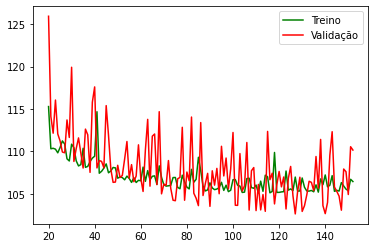

In [14]:
epochs_to_skip = 20 # Pula as épocas inicias para melhor visualização
x = list(range(epochs_to_skip, len(best_mlp_reg.costs)))
costs = best_mlp_reg.costs[epochs_to_skip:]
plt.plot(x, [cost['train'] for cost in costs], color='green', label='Treino')
plt.plot(x, [cost['validation'] for cost in costs], color='red', label='Validação')
plt.legend()

In [15]:
predictions_train_reg = best_mlp_reg.predict(X_train_reg)
predictions_vali_reg = best_mlp_reg.predict(X_vali_reg)

In [16]:
# Treino
train_metrics = {
  'RMSE': EvaluationErrorMetrics.rmse(y_train_reg, predictions_train_reg),
  'MAE': EvaluationErrorMetrics.mae(y_train_reg, predictions_train_reg),
  'MRE': EvaluationErrorMetrics.mre(y_train_reg, predictions_train_reg)
}

# Validação
vali_metrics = {
  'RMSE': EvaluationErrorMetrics.rmse(y_vali_reg, predictions_vali_reg),
  'MAE': EvaluationErrorMetrics.mae(y_vali_reg, predictions_vali_reg),
  'MRE': EvaluationErrorMetrics.mre(y_vali_reg, predictions_vali_reg)
}

In [17]:
# Retreinando modelo com treino e validação
best_mlp_reg.fit(X_train_reg, y_train_reg)
predictions_test_reg = best_mlp_reg.predict(X_test_reg)

# Teste
test_metrics = {
  'RMSE': EvaluationErrorMetrics.rmse(y_test_reg, predictions_test_reg),
  'MAE': EvaluationErrorMetrics.mae(y_test_reg, predictions_test_reg),
  'MRE': EvaluationErrorMetrics.mre(y_test_reg, predictions_test_reg)
}

Streaming output truncated to the last 5000 lines.
 [0.21876078]
 [0.45708464]
 [0.35627597]
 [0.28920134]
 [0.33202131]
 [0.31377023]
 [0.27787067]
 [0.15809737]
 [0.44401964]
 [0.34405579]
 [0.22212096]
 [0.53656568]
 [0.27359858]
 [0.68085783]
 [0.73100273]
 [0.3591647 ]
 [0.3850064 ]
 [0.68434982]
 [0.19333592]
 [0.38029778]
 [0.23430915]
 [0.34708865]
 [0.42965491]
 [0.61450386]
 [0.55654289]
 [0.74558643]
 [0.45121723]
 [0.49214167]
 [0.4514225 ]
 [0.29879036]
 [0.62363834]
 [0.20835265]]
[[ 0.45733702 -0.06891348 -0.43458585 ...  0.41092371  0.13282972
  -0.50229397]
 [ 0.43109959  0.15891929 -0.1862229  ...  0.31427136  0.21462385
  -0.37013382]
 [ 0.60701814 -0.21852883 -0.25709021 ...  0.3576783   0.08366077
  -0.6324114 ]
 ...
 [ 0.37321399  0.06744913  0.12390469 ...  0.32617542 -0.03551244
  -0.55366995]
 [ 0.5191787  -0.010915   -0.35027413 ...  0.30703655  0.25859625
  -0.33537168]
 [ 0.09324191 -0.03342932  0.02702542 ...  0.49161348 -0.1074927
  -0.264925  ]]
[[0.33271

Métricas de cada conjunto de dados:

In [18]:
import matplotlib
matplotlib.__version__

'3.4.2'

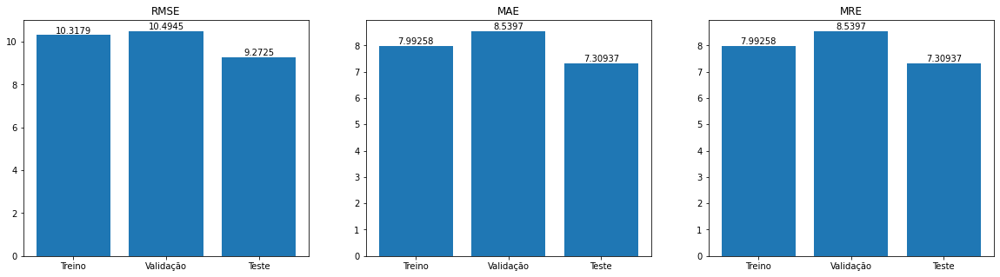

In [19]:
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20, 5))

ax0.set_title("RMSE")
sets = ['Treino', 'Validação', 'Teste']
values = [train_metrics['RMSE'], vali_metrics['RMSE'], test_metrics['RMSE']]
bar = ax0.bar(sets, values)
ax0.bar_label(bar)

ax1.set_title("MAE")
values = [train_metrics['MAE'], vali_metrics['MAE'], test_metrics['MAE']]
bar = ax1.bar(sets, values)
ax1.bar_label(bar)

ax2.set_title("MRE")
values = [train_metrics['MRE'], vali_metrics['MRE'], test_metrics['MRE']]
bar = ax2.bar(sets, values)
ax2.bar_label(bar)

plt.show()

### Questão 2

In [20]:
df_cla = np.genfromtxt("/content/vowel.csv", delimiter=",")
X_classification = df_cla[:, :-1]
y_classification = df_cla[:, -1]

In [21]:
# Treino e teste
X_train_cla, X_test_cla, y_train_cla, y_test_cla = train_test_split(X_classification, y_classification, test_size=0.2, random_state=42)
# Treino e validação
X_train_cls, X_vali_cla, y_train_cls, y_vali_cla = train_test_split(X_train_cla, y_train_cla, test_size=0.2, random_state=42)

Random Search para Classificação 

In [22]:
search_params_classification = {
  "alpha": ([0.001, 0.01], 'uniform'),
  "epochs": ([1000, 10000], 'randint'), 
  "momentum": [0.5, 1],
  'regularization': [0, 0.1],
  'layers': [
    ((i, 'tanh'), (11, 'softmax'))
    for i in range(10, 51)
  ],
  "batch": ([20, 100], 'randint'),
}

default_params_classification = {
  'task': 'classification',
  'cost_calc': 20 # Para diminuir o ruído na curva do custo
}

classification_model = RandomSearch(MLP, search_params_classification, default_params_classification, n_iter=10)
classification_model.fit(X_train_cls, y_train_cls, X_vali_cla, y_vali_cla)

Streaming output truncated to the last 5000 lines.
 [-1.24413810e-01 -1.58671970e-01  3.15763632e-01 -1.19567494e-01
   6.54190037e-01  1.16266782e-01  7.07968250e-02 -6.57169699e-02
  -6.06785394e-01 -2.04763586e-01 -3.31553514e-01  1.83756712e-01
   8.74810433e-03  3.32107422e-01  4.67937061e-01  2.68894768e-02
  -3.78273805e-01 -3.67558176e-02 -4.67269417e-01 -1.42288979e-01
   3.05168420e-01]
 [-1.38618943e-01 -2.40870480e-01  1.72162081e-01 -2.53929423e-01
   6.42289445e-01 -3.43149501e-01 -1.05686133e-01  5.46717451e-02
  -4.52420543e-01  2.07528586e-01  2.37750799e-03 -1.36916219e-01
   3.00954017e-01 -1.61357284e-01  6.24664421e-02 -1.59768418e-01
  -3.07920299e-01 -5.86171850e-01  1.33483658e-02  7.75100326e-02
   1.49905873e-02]
 [-6.39277770e-01 -4.51466397e-01  6.41259055e-01  3.16690078e-01
   7.14364066e-01  2.21923464e-01  4.38128445e-01  1.61738584e-01
  -3.93920228e-01  3.05277094e-01 -2.37489864e-01 -7.11070583e-01
  -2.32226716e-01  5.94438033e-01  7.19547716e-01 -4.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   4.79377969e-02 -2.74882734e-02  4.53111466e-01  8.84268544e-01
  -7.63427099e-01]
 [-5.11577818e-01  1.56638837e-01  2.78162622e-01  3.62890041e-01
   1.57226926e-01  1.09851934e-01  5.56636354e-02 -1.89074349e-01
  -2.31826225e-01  6.40781595e-02 -1.13997211e-01 -2.48299162e-01
  -3.23466922e-02 -5.48229223e-02  2.59404954e-01 -7.63754711e-01
  -1.42631399e-01  1.17157391e-01  1.71617198e-01  8.55655270e-02
  -7.40895111e-01]
 [-2.74842568e-01  4.28844157e-02  2.25581468e-01 -3.52082684e-01
   1.33955020e-01 -2.12663689e-01 -3.50986716e-01 -7.05192144e-04
  -1.99522181e-01  1.54581305e-01  3.94196754e-01 -4.61929735e-01
   2.51929121e-01 -6.63954578e-01 -2.26669833e-01 -8.37397950e-01
  -3.88707191e-02 -9.26280255e-01  5.55055819e-01  4.10830242e-01
  -7.74295059e-01]
 [ 1.96902265e-01 -4.91460980e-01  1.14368186e-02 -1.17025024e-01
   4.98488215e-01 -4.17923628e-01 -4.88722743e-01 -4.11298663e-01
  -2.85526688e-01  1.19354797e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [-3.67201052e-01  5.29871038e-01  2.28547472e-01  5.63871308e-02
  -1.54476468e-01 -7.61887079e-02  6.51702202e-04 -1.39880813e-01
  -4.97818702e-01 -1.94295725e-01  5.77489235e-01  1.38542470e-01
  -3.69006076e-03 -6.97326787e-01 -8.11007869e-02 -8.77958616e-01
   6.94819941e-02 -1.58694725e-01  6.73277538e-01  4.28383764e-01
  -9.21094272e-01]
 [-9.33916480e-01  1.16201839e+00  7.33233421e-01  1.73270919e-01
  -2.11342717e-01  6.94521409e-01  5.56443166e-01 -1.11015395e-01
  -7.44275671e-01 -6.51398473e-01  6.28458764e-01  6.05342233e-01
  -8.15989765e-01 -8.50097600e-01  2.94236376e-01 -7.67860097e-01
   9.60698354e-02  1.12552008e+00  3.74827802e-01  8.40209567e-01
  -9.40586106e-01]
 [-4.20828336e-01  6.66244008e-03  2.09339830e-01  8.78409716e-01
   9.73116188e-02  4.08993215e-02  3.28662055e-01 -5.82809102e-01
  -2.84300577e-01 -4.72463452e-02 -6.15104821e-01  3.69623832e-02
   8.57084708e-02  4.52625250e-01  5.91263886e-01 -8.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.81185290e-01  1.24766516e+00  3.66708308e-01  1.74071204e-01
  -1.23754288e+00]
 [-2.26225291e-01  2.19115405e-01  2.94283830e-03  2.44510746e-01
   1.97701283e-01 -2.79895748e-01 -2.75688914e-01 -4.28406638e-01
  -5.40236635e-01 -2.76870642e-01  2.33798275e-01 -1.38072008e-01
   3.35897352e-01 -4.95739225e-01 -2.41871632e-01 -7.16001935e-01
   1.61572819e-01  1.77148327e-01  3.93405379e-01  1.11553683e-01
  -8.37781103e-01]
 [-2.13165025e-01 -3.06089949e-01 -5.62280980e-01  5.32826819e-01
   5.18801503e-01 -6.08531061e-01 -7.98856203e-01 -3.33596727e-01
  -2.70187522e-01  4.76050489e-01 -1.05813752e-02 -1.06066127e+00
   8.98274419e-01 -1.55026167e-01 -5.98760038e-01 -1.10545859e+00
  -2.51510509e-01 -1.20102378e+00  1.13193101e+00 -4.00001893e-01
  -1.37119585e+00]
 [-1.32606386e-01  6.31784416e-02 -3.66158689e-02 -3.71651158e-01
   4.56337551e-01 -3.70080497e-01 -7.16226019e-01 -1.59920514e-01
  -3.79444359e-01  2.24000803e-02 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.99330469e-01 -6.32564819e-01  4.13715682e-01  7.79107540e-01
  -7.54979217e-01]
 [-4.44867506e-01  8.47282028e-01  4.18762044e-01 -4.47135676e-01
  -3.77307811e-01  3.71862666e-03 -5.31196804e-02  1.83151410e-02
  -3.92439898e-01 -3.86714309e-01  7.85925597e-01  1.08556360e-01
  -7.52205815e-02 -1.19468062e+00 -2.86445949e-01 -1.04263855e+00
   8.78514547e-02 -3.24002362e-01  7.44131562e-01  1.07175351e+00
  -1.06738602e+00]
 [-1.76680212e-01 -7.59907176e-01 -3.98182839e-01  6.79347331e-01
   5.88376765e-01 -7.69841811e-01 -8.11206686e-01 -3.81677451e-01
   9.31966718e-02  8.75248930e-01 -6.02630117e-01 -1.32260939e+00
   1.41268848e+00  2.75814589e-01 -4.32805330e-01 -1.83113967e+00
  -3.28638306e-01 -2.07648907e+00  1.29657893e+00 -1.07949351e+00
  -1.72335628e+00]
 [ 8.17150693e-02 -7.97140405e-02 -8.61687818e-02 -1.16504159e+00
   3.90584990e-01 -6.29737114e-01 -9.87675062e-01  2.02832594e-02
  -1.25795797e-01  1.42504483e-03 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -7.29738613e+00  1.91354011e+00 -4.45420720e-01]
 [-2.14150343e+00 -6.18633095e+00 -4.74819043e+00  4.39065468e+00
   4.03452854e+00  2.35222620e+00  1.91449758e+00  2.18471976e+00
  -8.09732943e+00  4.07095943e+00  2.84121957e+00]
 [ 6.14919654e+00  2.59272208e+00 -1.06726220e+00  1.71663595e+00
  -3.03868432e+00  4.83440042e+00  4.78343045e+00  1.71809654e+00
  -4.40731023e+00 -3.82886849e+00 -8.89652692e+00]
 [-3.10881039e+00 -8.41678752e+00 -6.68964071e+00  6.54670531e+00
   5.26012493e+00  3.92715521e+00  1.03047925e+00  1.56086256e+00
  -1.00654581e+01  8.06302391e+00  2.93878188e+00]
 [ 4.08625025e+00  5.56596988e+00  4.26148310e+00 -1.69441767e+00
  -2.83040586e+00  1.18602424e+00  2.43129602e+00  3.16190534e+00
   1.38182735e+00 -6.98164653e+00 -9.37845011e+00]
 [-5.36935813e+00 -8.13240897e+00 -4.50841174e+00  4.48101292e+00
   6.05574125e+00  2.04610541e+00  6.79053739e-01  3.09919848e+00
  -8.63506923e+00  5.93825096e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [-1.91639863e-01  2.13604217e-01  2.47814299e-02  1.51245802e+00
   4.95398967e-01  6.89530951e-01  3.93359637e-01 -9.00129853e-01
  -4.03677020e-01 -6.84054857e-01 -8.47400425e-01 -1.42254152e-01
   2.16944349e-01  1.01754578e+00  7.51864869e-01 -1.20855376e+00
  -5.09977652e-02  8.06345579e-01 -1.88070154e-01 -1.12246736e+00
  -7.67600817e-01]
 [ 1.58001816e-02  1.31465119e-01 -3.76326399e-02 -1.59240026e-01
   5.72776605e-01 -2.37601321e-01 -5.94134130e-01 -2.77786805e-01
  -3.00853139e-01 -2.40641692e-01  2.03823800e-01 -9.13254706e-01
   7.70078553e-01 -9.60367084e-01 -5.51393440e-01 -1.37917098e+00
   2.73926902e-01 -7.04361620e-01  8.40935254e-01 -8.38958964e-02
  -1.31991840e+00]
 [ 1.39713279e-01  3.79917531e-01 -1.39113428e-01 -2.77340948e-02
   3.23681640e-01  1.23189153e-02 -1.49952011e-01 -5.23407815e-01
  -4.49682895e-01 -6.87149371e-01 -5.37675187e-03 -1.50568897e-01
   3.70857269e-01 -2.41177026e-01 -1.40598303e-01 -9.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   8.02309797e-02 -3.47573886e-02 -1.28322238e+00 -6.36550419e-01
   9.76473220e-01  1.32211223e+00  1.93591703e-01 -1.82066709e+00
  -1.42551814e-01 -4.39032674e-01  5.91373032e-01 -1.61045013e+00
  -1.23103209e+00]
 [-1.55622629e-02 -1.52475846e-01 -8.49697941e-01  3.52352198e-01
   6.84110714e-01  4.38028987e-01 -8.87376528e-01 -1.76545241e-01
  -1.50621368e-01  3.89345228e-01  7.46197919e-02 -1.21321627e+00
   7.63425820e-01 -2.44433365e-02 -1.18275701e+00 -1.60216810e+00
  -3.40279545e-01 -2.01391729e+00  2.24893910e+00 -1.62632416e-01
  -1.95010813e+00]
 [-6.14223688e-01  1.49613514e+00  9.02231351e-01  3.58283136e-01
  -6.66793134e-01  1.99663975e-01  8.59929526e-01 -4.72405660e-01
  -8.07152832e-01 -1.07583281e+00  5.49881795e-01  1.44944914e+00
  -1.92558684e-03 -9.92834272e-01 -2.52477981e-02 -1.83455904e+00
   4.29304485e-01  1.39617561e+00  3.63216371e-01  8.66612880e-01
  -1.91897522e+00]
 [-7.98273240e-01  9.97972771e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   -0.61130347   1.07130342   2.99247323  -0.93255065  -2.84695279
   -1.2574962 ]
 [  5.88088326   4.2644875    0.95692124   0.47424778  -2.67104185
    3.06280763   4.42259981   3.24290064  -3.44042863  -5.92103158
   -9.10414247]
 [  4.90915854   3.71884461   1.22094038   0.59180695  -2.28465301
    3.19518684   3.60590757   3.04059688  -3.25161869  -4.90023061
   -8.94387332]
 [  1.33708436  -2.77249642  -3.29140581   4.45587095   2.43566774
    3.66334829   2.41053332   2.28709517  -7.87940905   2.52369766
   -3.06877784]
 [  0.70303843   4.9048984    6.56021683  -4.76563215  -1.30503891
   -4.11562024   1.19333422   3.98870297   5.96353714  -9.88838341
   -1.83900044]
 [ -7.27192078  -6.02616679   0.70912999   0.85837965   6.02961964
   -3.68095916  -0.35421636   4.38089639  -2.38158737   0.72644159
    8.60452953]
 [ -0.87808599  -1.24741762   0.41396763   0.92742852   2.07212216
    0.83596721   0.81221509   3.2383458   -2.8109

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    5.66591842   4.27036488   2.96882337 -12.7332388    3.0772111
   -2.94608236]
 [  0.42545233   6.23090733   6.90212252  -3.88888992  -0.51651271
   -4.82623989   0.63291805   3.11707373   4.88435836  -8.59429284
   -1.54791885]
 [  2.21367706  -1.35708908  -3.81297603   3.7003536    0.81327575
    4.62306854   4.1559975    2.41397896 -10.5742317    0.93090484
   -3.57202853]
 [  3.83690157  -0.04600527  -1.79909634   3.35127564  -0.41063681
    4.53684405   5.05852361   3.31466507  -6.70907464  -2.13392594
   -7.3818549 ]
 [ -4.70223072  -8.71275647  -4.83474671   5.11506205   5.96984165
    2.18156667  -0.5207778    0.96193083  -6.19350242   7.95111436
    4.03050262]
 [  1.60827017  -4.43962348  -4.95385278   5.9935973    2.72188224
    5.77563482   3.41545515   2.78564038 -11.23262572   3.84618861
   -4.19835938]
 [ -3.41948302 -10.25737817  -8.05158717   7.494461     7.00655764
    4.6571194    0.74427677   1.91940686 -13.83694

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -1.71896042e-01 -1.01131254e+00  1.60135023e+00 -5.11253808e-02
  -1.28965595e+00]
 [-4.59061136e-01  1.04097603e+00  2.60576712e-01  8.40290847e-02
  -1.04130524e-01  6.92003769e-01 -3.12415710e-03  1.73724233e-01
  -5.90772218e-01 -5.17739086e-01  7.10173124e-01 -2.55904818e-01
  -3.25105955e-01 -1.26564731e+00 -7.11737036e-01 -2.07164982e+00
  -3.10209319e-01 -6.43254684e-01  1.41499048e+00  8.53943124e-01
  -2.26681886e+00]
 [ 6.79470938e-02  9.30095160e-02 -3.64549954e-01 -2.22204717e-01
   4.89049324e-01 -1.71702008e-01 -6.13226147e-01 -7.18926985e-02
   1.73818873e-03  1.72863233e-01 -1.58956053e-01 -7.43217353e-01
   9.21229336e-01 -7.96536719e-01 -1.10746241e+00 -1.79381221e+00
  -1.05393218e-01 -8.60737042e-01  1.56271473e+00  1.79242465e-01
  -1.91831739e+00]
 [ 6.22944814e-01  3.48863824e-01 -5.17204979e-01 -9.87566822e-01
   7.18715607e-01 -5.22920939e-01 -1.04320682e+00  1.56094894e-01
  -7.84655690e-02 -2.44155197e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.98498020e-01 -9.52802931e-01  1.42516335e+00 -2.98640758e-01
  -1.53362389e+00]
 [-9.61957997e-01  1.59503562e+00  9.93772874e-01  1.82324700e-01
  -7.18043733e-01  6.89292496e-01  9.44805689e-01 -2.01273809e-01
  -7.60740212e-01 -1.06033027e+00  3.92502160e-01  9.27740436e-01
  -4.01045270e-01 -1.02839236e+00 -1.85930602e-01 -2.47719148e+00
  -1.21092515e-01  9.44749915e-01  3.39160602e-01  9.92567154e-01
  -2.42653484e+00]
 [-3.53042235e-02  5.44453263e-01 -2.74737071e-01  2.81960150e-01
   6.75040201e-01  3.44924881e-01 -1.64812430e-01 -2.87609283e-01
  -3.55641149e-01 -3.61062178e-01  2.42147092e-03 -6.96203869e-01
  -1.31074567e-02 -6.92136741e-01 -3.97637628e-01 -1.63617227e+00
   3.01132053e-02 -3.14279425e-01  8.03177312e-01  9.65960068e-02
  -1.40405787e+00]
 [-5.97074527e-01  1.26086790e+00  5.30799470e-01  7.55822912e-01
   1.60186733e-01  8.68378708e-01  6.34159307e-01 -4.19989028e-01
  -6.61148133e-01 -1.02503424e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.67591375e-01  1.76995312e+00 -3.26457280e-01  7.02136295e-01
  -7.28008349e-01]
 [-8.80966674e-02  1.51322755e+00 -6.35576127e-01 -7.42439696e-01
   2.07468299e-01  7.33443845e-01 -7.14089102e-02  9.54873272e-02
  -4.67101387e-01 -1.28501285e+00  4.91719799e-01 -8.91916676e-02
  -6.46788163e-01 -3.05406312e-01 -3.63880934e-01 -7.30699018e-01
  -3.01079385e-01  2.84832266e-01  6.89861584e-01  1.00461478e+00
  -5.97217931e-01]
 [ 2.29788415e-01 -3.93244808e-01 -6.85559799e-01  6.02876845e-01
   1.35297422e+00  4.32326631e-01 -2.59503872e-01 -7.77451238e-01
   1.94592310e-01  1.03641560e-01 -9.84595569e-01 -1.27903354e+00
   9.02231579e-01  3.86848372e-01 -2.09467911e-01 -2.23026099e+00
   1.22571840e-01 -8.45285476e-01  6.59491543e-01 -7.88903804e-01
  -1.42363227e+00]
 [ 2.58147614e-01  6.29284431e-01 -7.09067063e-01  1.69401457e-01
   7.83375230e-01  3.51322811e-01 -8.76195192e-02 -4.95788545e-01
  -4.99655963e-01 -7.00625410e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -3.02290491e-01 -6.64940504e-01  1.58964180e+00 -1.55596077e-01
  -9.14592236e-01]
 [-5.10239829e-01  2.93733016e+00  9.59722732e-01 -9.91766038e-02
  -1.06568139e+00  3.96764878e-01  8.73538301e-01 -1.30126097e-01
  -1.50301192e+00 -2.20722651e+00  1.04770829e+00  1.22830425e+00
  -4.10164712e-01 -1.68873139e+00 -4.49961050e-02 -1.71579812e+00
   2.87401248e-01  1.96628465e+00 -2.24570931e-01  1.44342783e+00
  -1.86278737e+00]
 [-3.67666624e-01  1.55607017e+00  1.01975720e-01  5.79753813e-01
  -1.76126785e-01  9.72337688e-01  7.19926362e-01 -3.10490519e-01
  -8.88154756e-01 -1.27427653e+00  3.06895680e-01  7.17573432e-01
  -6.56057619e-01 -2.95149129e-01  3.21847007e-02 -1.61467668e+00
  -3.25202326e-01  9.43346334e-01  3.70558006e-01  4.36589596e-01
  -1.39925074e+00]
 [ 2.11853701e-01  8.13360231e-01 -7.70250173e-01 -3.55311380e-01
   7.07025066e-01  2.07555646e-01 -6.24083518e-01  2.56194516e-02
  -3.52296302e-01 -4.95321653e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.99254666e+00  5.45141598e+00  7.13306450e+00  3.61024551e+00
  -8.74783541e+00 -6.20692604e+00 -1.08461955e+01]
 [ 2.15842310e+00  6.93335881e+00  6.47918444e+00 -3.74332289e+00
  -1.85422184e+00 -3.20609303e+00  1.93739037e+00  3.56767243e+00
   3.19840043e+00 -1.00692125e+01 -3.74134472e+00]
 [ 3.85577706e+00  8.20039729e+00  8.41939045e+00 -6.27803898e+00
  -4.14958600e+00 -2.81586571e+00  1.03676637e+00  3.61962597e+00
   8.94973835e+00 -1.26937515e+01 -7.32502036e+00]
 [ 9.48301726e-01 -4.40873600e+00 -4.33671963e+00  5.47209743e+00
   1.58280184e+00  6.11381121e+00  5.22933768e+00  3.79691778e+00
  -1.10586383e+01  1.62671882e+00 -4.65513129e+00]
 [ 9.64484584e+00  5.90474414e+00 -1.39824830e-02  5.56342643e-01
  -3.96810974e+00  5.37894844e+00  6.57679491e+00  3.12029381e+00
  -7.21102612e+00 -7.42096628e+00 -1.23011758e+01]
 [ 6.47603101e+00  5.02292511e+00  1.29737341e+00  2.55574181e-01
  -3.09677670e+00  3.15161422e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.92984585e-02  6.85185316e-01  6.65822942e-01 -1.14420365e-01
   1.94097354e-01]
 [ 1.39519219e+00 -6.98673485e-01 -1.47937152e+00  1.37515516e+00
   2.81042562e+00  8.46661778e-01 -3.39491473e-01 -1.29366282e+00
  -1.71471248e-01 -1.52630272e-01 -1.36624217e+00 -1.59990201e+00
   1.30258005e+00  1.01474747e+00  2.26590092e-01 -2.02415792e+00
   5.34100378e-01 -5.59131649e-01  2.58983423e-01 -2.64111890e+00
  -6.71114797e-03]
 [ 1.84662992e-01  1.69940654e+00 -1.05139757e+00  2.82431383e-01
   8.47356472e-01  1.12600709e+00 -1.43713078e-01  6.41664047e-03
  -1.23782854e+00 -1.29322905e+00  5.79415641e-01 -1.58345137e-01
  -8.34479887e-01 -5.97596213e-01 -6.05807031e-01 -5.03015655e-01
  -4.05788256e-01  6.69291581e-01  1.27131497e+00  2.04204361e-01
  -8.18668419e-01]
 [ 1.32709336e+00  7.24933905e-01 -1.02562093e+00 -3.65929674e-01
   1.58608075e+00  6.64633540e-02 -3.53992782e-01 -5.10289924e-01
  -4.17912226e-01 -9.21279476e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [ 1.40435214e+00  1.95801709e+00 -1.22701983e+00  6.73726932e-01
   2.25010298e+00  6.47937404e-01 -4.76815331e-01 -8.70605908e-01
  -9.66775169e-01 -2.07549812e+00 -8.73550312e-01 -1.06986394e+00
  -2.46315632e-01  2.28230936e-01  1.12107794e+00  5.01918965e-01
   6.71389919e-01  2.33648875e+00 -1.42385548e+00 -1.35451149e+00
   1.81019649e+00]
 [ 9.65129273e-01 -3.37609353e-01 -3.30551107e-01  7.57237872e-01
   1.81447751e+00  5.41057888e-01 -1.68684684e-01 -1.28357878e+00
   1.62231167e-01 -3.74567552e-01 -1.44979942e+00 -1.64282139e+00
   1.54462570e+00  5.92285682e-01  5.46730049e-01 -2.52314360e+00
   8.14587539e-01 -3.77115569e-01 -5.80799944e-01 -1.85483295e+00
  -2.13463153e-01]
 [-1.33506960e-01  1.70979994e+00  3.29117308e-01  7.14955807e-01
   3.32409178e-01  8.99682945e-01  2.21640185e-01 -4.13397015e-01
  -8.38143551e-01 -1.34817836e+00 -1.33768311e-01 -4.70672543e-01
  -4.33613216e-01 -7.64980279e-01  3.41485349e-01 -1.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [ 6.20891088e-01  7.76322975e-01  9.91535172e-03 -2.73169386e-01
   4.36445375e-01  1.66153773e-01  6.72181627e-02 -3.82176916e-01
  -6.30405954e-01 -6.44092195e-01  5.28185836e-01 -1.83380892e-01
   1.18298265e+00 -1.22770800e+00 -8.66149644e-01 -2.31057964e+00
   4.62201441e-01 -7.02790590e-01  1.43735513e+00  1.81670540e-01
  -1.74065965e+00]
 [ 1.48884028e-01 -7.18758299e-01 -8.37386164e-01  1.26723270e+00
   1.39541107e+00  1.02713606e+00  1.94614029e-02 -8.36964782e-01
  -1.53781341e-01  4.47539451e-01 -7.73852399e-01 -9.76071656e-01
   8.36018023e-01  3.80052530e-01 -8.12902523e-01 -2.78027126e+00
  -3.15077095e-01 -1.23236493e+00  1.72436065e+00 -1.16681802e+00
  -2.11908413e+00]
 [ 1.60031639e+00 -1.97867725e-01 -1.43275796e+00 -3.86325808e-01
   2.20571302e+00 -2.67004311e-01 -1.04406752e+00 -4.66146589e-01
   3.29489383e-03  4.60174291e-02 -2.96777301e-01 -1.57100133e+00
   1.40772342e+00 -6.18033609e-01 -9.17929372e-01 -1.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -3.55551388e-01 -2.49546446e-01  1.40500914e-01 -2.16594430e+00
  -3.95202498e-01]
 [ 4.53177026e-01  2.04248592e+00 -1.12101014e+00 -1.80605464e-01
   9.10422354e-01  1.16195528e+00  1.60186540e-01 -4.28509249e-02
  -1.05785964e+00 -1.83912369e+00  3.33822171e-01  5.40310058e-01
  -1.55499502e+00 -9.24482925e-02  3.85069210e-02  3.30869291e-01
  -5.98843251e-01  1.47589536e+00  2.20295608e-01  1.68567494e-01
   6.31362747e-01]
 [-2.46329627e-03  2.28826727e+00  6.07913124e-01  1.67588537e-03
  -3.86720015e-01  4.57138415e-01  4.73921644e-01 -3.11482793e-01
  -8.74305696e-01 -1.74759625e+00  1.43573847e-01  4.96064987e-01
  -6.19152696e-01 -1.19221597e+00  7.48838451e-01 -1.24809839e+00
   1.06856348e-01  1.95644968e+00 -9.66785040e-01  9.54525865e-01
  -9.45934161e-01]
 [ 1.02297469e+00  8.72775367e-01 -1.69767117e+00 -3.94012409e-01
   1.78626520e+00  4.33379073e-01 -6.08205565e-01 -7.24318633e-02
  -6.40890621e-01 -7.37093221e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    5.57706893]
 [  2.92492064  -0.49366653  -2.48804455   1.7664187    0.17043947
    4.68537153   4.30655245   2.99613371  -7.48470232  -1.71607325
   -4.43432006]
 [ -0.04048762   0.08234289   2.39715607   0.24645966   1.97915941
   -0.55236329   1.87298637   5.05494331  -3.82803085  -4.4244072
   -1.6368024 ]
 [  9.96438209   5.59004375  -1.35038469   1.62761801  -3.74319521
    6.38397715   7.42962716   3.37245881  -9.78752588  -7.32916228
  -11.6725432 ]
 [  8.31426009   3.78222205  -1.01341524   1.12307499  -3.52784084
    6.0889574    6.29252624   2.84262795  -6.8415851   -6.33286661
  -10.39235999]
 [ -4.48557523 -10.49616545  -5.96465849   6.85042827   7.21617423
    3.98942852  -0.25111358   2.1639221  -11.17576387  10.41289709
    2.40813528]
 [ -7.33823774  -3.57950553   2.81182682  -1.5376163    4.41411776
   -5.73013612  -2.09804537   0.43459003   4.73838069   0.18974159
    8.53164804]
 [ -1.09975745  -5.09335156  -3.93

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   6.72696898e-02 -1.12611122e+00  1.15308978e+00 -1.04095896e+00
  -9.41880266e-01]
 [ 2.71159296e-01 -4.23725841e-01 -7.21825242e-01  8.17345742e-02
   1.09954590e+00  6.81509040e-02 -6.09060774e-01 -2.97755981e-01
  -8.01157557e-02  5.17325032e-01 -2.77075167e-01 -1.57209572e+00
   1.45990102e+00 -8.62750225e-01 -1.37827994e+00 -2.31348747e+00
   3.82099316e-02 -1.92058728e+00  2.28312691e+00 -1.67782690e-01
  -2.15567954e+00]
 [-5.13135869e-01  1.35495195e+00  7.91238571e-01  7.09494469e-02
  -6.59807123e-01  8.17052058e-01  5.98678881e-01 -5.19020458e-02
  -1.11160767e+00 -9.63873463e-01  1.02828503e+00  1.04780117e-01
   6.85227761e-01 -1.61131327e+00 -1.08630686e+00 -2.93637432e+00
  -1.88520489e-01 -9.06415287e-01  1.89683030e+00  7.89942845e-01
  -2.81834422e+00]
 [ 2.78631528e-01  1.84659629e+00 -7.14472728e-01 -6.38908137e-01
   2.32298167e-01  2.71958526e-01 -2.82032229e-01  3.21431700e-01
  -1.08937820e+00 -1.18567146e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -6.67338114e-02 -9.13212877e-01  1.93279468e+00  2.14145803e-01
  -2.05881083e+00]
 [ 1.04100440e+00  6.59390305e-01 -8.47161965e-01 -9.14878344e-01
   1.07694684e+00  8.37831155e-02 -3.74990874e-01 -2.60292128e-01
  -4.41021923e-01 -5.76120770e-01  4.07793425e-01 -4.37849492e-01
   1.11075498e+00 -9.64033352e-01 -1.18599313e+00 -1.21985919e+00
   4.10853021e-01 -8.16628741e-01  1.79251848e+00  1.41297826e-01
  -9.27398307e-01]
 [ 1.66277457e+00 -7.96903392e-01 -1.63878517e+00  1.31227679e+00
   3.20499114e+00  1.20373864e+00 -2.43502344e-01 -1.41979666e+00
  -1.34641966e-01 -2.31188134e-01 -1.31005857e+00 -1.33344736e+00
   1.51016549e+00  1.15541456e+00  1.33381133e-01 -2.33903483e+00
   5.28152856e-01 -8.94784474e-01  4.48073577e-01 -2.81337804e+00
   1.27902754e-01]
 [ 5.24233139e-02  1.44683515e+00 -2.05536279e-01 -3.54267467e-01
   1.86096598e-01  5.50230804e-01 -2.03801549e-02  1.97155752e-01
  -8.18988351e-01 -8.64692329e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -6.75419876e-01 -2.81474319e+00  4.46930907e+00 -8.40314082e-01
  -3.24647591e+00]
 [ 4.52049167e-01 -4.15693934e-01 -7.94132379e-01  7.88986762e-01
   1.56793752e+00  7.83134597e-01 -1.88551648e-01 -8.37450168e-01
  -1.37246140e-01  3.53631076e-02 -9.44472387e-01 -1.09150339e+00
   1.08178271e+00  2.58063633e-01 -3.16984899e-01 -2.50704559e+00
   7.37507367e-03 -6.68803923e-01  9.05555756e-01 -1.19378136e+00
  -1.21810367e+00]
 [-8.14080534e-01  2.94478186e+00  2.03439898e-01  6.32462113e-01
  -6.73549195e-01  1.27621996e+00  6.22037735e-01  2.24745227e-01
  -1.94823848e+00 -1.95896224e+00  9.63404196e-01  9.25805324e-01
  -1.56062693e+00 -1.41295259e+00 -6.47580092e-01 -6.33806168e-01
  -9.68316396e-01  1.57625782e+00  1.01033989e+00  9.32866782e-01
  -1.92721564e+00]
 [ 1.42700778e+00 -2.43902557e-01 -1.10440422e+00  1.12325865e+00
   2.49989223e+00  6.07649775e-01 -3.95166723e-01 -1.07487782e+00
  -4.06827952e-01 -2.45789400e-01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    4.5046806    5.77634184   5.12066848  -8.47823364  -0.96442478
   -4.52943553]
 [ -1.9658078    2.63650701   4.60833354  -1.25454687   1.59562872
   -5.07387592  -0.68703083   1.39610585   2.61874716  -3.96436279
    1.28240772]
 [ -2.56662316 -10.27301937  -6.12657229   8.62822784   4.9958397
    6.32186583   3.69544811   3.42226226 -14.28759759   7.45039756
   -0.76679589]
 [  0.70927791  -2.85644427  -3.7092048    4.34105562   2.98123779
    3.61257823   3.09841632   2.72818116 -13.69383142   2.52988522
   -0.08058123]
 [  1.46494845  -3.69915486  -4.2253845    4.94197557   1.34725088
    6.08451629   4.15407052   2.770686   -12.6540018    2.66419897
   -3.23292461]
 [ -4.34814895  -1.98175559   7.83200424  -5.61487626   2.98236475
   -8.86725777  -0.42052755   4.29745222   8.37984618  -8.87788053
    7.49570102]
 [ -0.29365628  -0.56636784   2.46753824   1.1997001    2.32917285
   -0.83537843   1.61505794   5.28683936  -4.71117

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -6.51933010e+00  5.57475345e+00  7.92121564e+00]
 [ 5.74781991e+00  2.49099263e+00 -4.89141764e-01  8.99975154e-01
  -1.70255251e+00  4.13445297e+00  5.38039453e+00  4.13728294e+00
  -5.46719302e+00 -6.53492359e+00 -7.98664086e+00]
 [ 1.72706194e+00  5.73488192e-01  1.51041611e+00 -6.39529468e-01
   4.99710531e-01  4.84903964e-01  2.37445424e+00  3.89332943e+00
  -9.62253231e-01 -5.89883639e+00 -2.85566221e+00]
 [ 2.98038159e+00  1.51079819e+00  1.96810512e+00 -7.76749747e-01
   6.89977162e-01 -7.64999306e-01  1.74622480e+00  2.71144063e+00
  -2.88748765e+00 -5.35070845e+00 -1.41941390e+00]
 [-6.12694767e-03  2.66961409e+00  6.13102527e+00 -4.68670240e+00
  -4.58014742e-01 -3.62055495e+00 -4.32513387e-01  3.16782664e+00
   4.62429110e+00 -7.45336185e+00  2.56445326e-01]
 [ 2.55953166e-01 -5.24146923e+00 -4.52620933e+00  5.71272332e+00
   3.93139487e+00  4.03630992e+00  1.63435426e+00  9.93839522e-02
  -8.53859887e+00  4.25933599e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [ -1.45639883   0.84827744  -0.91931435   4.49082379   2.05366195
    2.59452712  -0.80343373   0.61520657  -3.46310416   2.65050046
   -5.8756839 ]
 [  4.14384816   9.10754981   4.88712794  -1.55978     -3.9201483
   -0.65616115   2.53673598   2.13778933   1.71593895  -9.6367302
   -7.96915336]
 [  2.91602647   1.94458193   1.8654082   -0.42259606  -0.78958475
    1.70602915   3.80653047   5.1052014   -3.3943898   -6.78288571
   -5.4885952 ]
 [ -4.38839914 -10.52958905  -5.52704968   7.19985347   8.77382077
    3.1989212   -0.40607754   1.95452527 -15.14462131   9.99573784
    5.02671823]
 [  2.30984178   9.47500483   9.89565765  -7.82405103  -4.89078401
   -5.98577563   1.04399423   1.21668254  12.50283884 -14.39870423
   -2.81563518]
 [ -6.08469198  -4.08064421   4.27793576  -4.91243498   6.0572667
   -8.6616845   -3.43560129   2.50962485   4.95881529  -2.42866126
   12.18409346]
 [  4.07304533  -0.40081439  -2.96388285   3.2670021

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.34656769e+01  4.09304725e-01 -3.64312447e+00  5.21266163e+00
  -1.36220298e+01  1.02398205e+01  6.79805080e+00]
 [-1.63957041e+00 -1.12299431e+01 -7.65239935e+00  1.01911917e+01
   5.76156488e+00  8.76487218e+00  5.33198472e+00  4.36301185e+00
  -1.54655536e+01  5.86890354e+00 -3.69016899e+00]
 [ 4.61512938e+00  1.42387531e+00 -2.85833097e+00  5.20810457e+00
   2.07107078e-01  8.56670330e+00  8.34482516e+00  4.64380794e+00
  -1.85358221e+01 -1.28125505e+00 -1.08387436e+01]
 [-2.09800863e+00  6.85821717e-01 -4.72177306e-01  2.30270253e+00
   4.63331284e+00 -3.10732127e-01 -3.44000990e-01 -6.26811945e-01
   1.50209268e-01 -5.63187757e-01 -3.70402204e+00]
 [-4.80274170e+00 -8.74956893e+00 -4.57282974e+00  9.52197864e+00
   5.89003089e+00  7.49816316e+00  3.30663330e+00  4.32647129e+00
  -1.50415309e+01  6.75376470e+00 -3.83469183e+00]
 [-1.13378744e+01 -1.58286514e+01 -6.70516441e+00  7.08400004e+00
   1.56074469e+01  1.87812107e+00 

In [23]:
best_mlp_cla, best_params_cla = classification_model.best_fit()

print(f"Melhores hiperpâmetros para classificação: \n{best_params_cla}")

Melhores hiperpâmetros para classificação: 
{'alpha': 0.0067268083036874675, 'epochs': 6143, 'momentum': 0.5056211459649865, 'regularization': 0.035253158511754014, 'layers': ((25, 'tanh'), (11, 'softmax')), 'batch': 85}


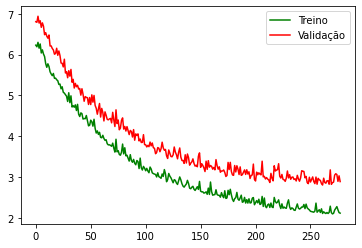

In [24]:
epochs_to_skip = 30 # Pula as épocas inicias para melhor visualização
x = list(range(len(best_mlp_cla.costs) - epochs_to_skip))
costs = best_mlp_cla.costs[epochs_to_skip:]
plt.plot(x, [cost['train'] for cost in costs], color='green', label='Treino')
plt.plot(x, [cost['validation'] for cost in costs], color='red', label='Validação')
plt.legend();

In [25]:
predictions_train_cla = best_mlp_cla.predict(X_train_cla)
predictions_vali_cla = best_mlp_cla.predict(X_vali_cla)

In [26]:
# Treino
train_accuracy = ClassificationMetrics.accuracy(y_train_cla, predictions_train_cla)

# Validação
vali_accuracy = ClassificationMetrics.accuracy(y_vali_cla, predictions_vali_cla)

In [27]:
# Retreinando modelo com treino e validação
best_mlp_cla.fit(X_train_cla, y_train_cla)
predictions_test_cla = best_mlp_cla.predict(X_test_cla)

# Teste
test_accuracy = ClassificationMetrics.accuracy(y_test_cla, predictions_test_cla)

Streaming output truncated to the last 5000 lines.
  -2.70691099e+00  4.26260995e+00  5.79035699e+00]
 [-1.14109138e+00 -5.99709875e-01  4.29173030e-01  3.14720039e-01
   7.00173368e-01 -6.65286498e-01  2.29556707e-01  1.35370015e+00
  -1.28868768e-02 -9.40132675e-01  3.54972717e-01]
 [-3.59415640e+00 -4.73532905e+00 -3.01328979e+00  2.08726928e+00
   3.47790497e+00  4.87776067e-01 -5.33224582e-01  1.09375063e+00
  -4.58572499e+00  3.97326064e+00  3.40190473e+00]
 [-3.24446930e+00 -4.02871861e+00 -2.43729325e+00  2.04248610e+00
   3.19724321e+00  2.62374386e-01 -5.07120069e-01  1.08561904e+00
  -3.90800760e+00  3.48691237e+00  3.28733499e+00]
 [-6.90830514e-02  2.26876243e+00  2.90412284e+00 -1.46626294e+00
  -7.93809471e-01 -2.13543545e+00  3.61020678e-01  1.75896886e+00
   2.96525737e+00 -4.59608074e+00 -1.05606154e+00]
 [ 1.89460945e+00  1.10449704e+00 -2.25746108e-04  1.43082977e+00
  -1.03512981e+00  1.43949553e+00  2.13258586e+00  1.07173226e+00
  -1.71461932e+00 -1.32645000e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -8.31170524e+00  4.20197486e+00 -2.46414809e+00]
 [-1.76834667e+00  5.02116191e-01  1.62607622e+00  6.96094831e-02
   2.18542077e+00 -2.43520341e+00  1.94303140e-03  2.74350472e+00
   4.47287572e-02 -1.76424624e+00  8.76587614e-01]
 [-3.04238941e+00 -5.10080134e+00 -2.96793300e+00  3.35731010e+00
   4.38116967e+00  1.06786195e+00  8.84473943e-02  2.70597539e+00
  -6.21610412e+00  4.18285524e+00  6.44088575e-01]
 [ 1.04244525e+00 -1.24115654e+00 -2.84667942e+00  2.67208091e+00
   1.28912153e+00  2.82165258e+00  2.37783665e+00  2.13637141e+00
  -5.61949445e+00  2.93900030e-01 -1.48629211e+00]
 [ 2.90212750e+00  9.21406744e-01 -1.27745229e+00  3.14246971e+00
  -5.54292340e-01  3.43889523e+00  3.22243652e+00  2.31173054e+00
  -3.58402277e+00 -8.74913182e-01 -7.52705531e+00]
 [-2.52686729e+00 -5.69956051e-01  2.11546129e+00 -1.81373012e-01
   2.26995866e+00 -2.66428203e+00  2.55791274e-03  3.73603021e+00
  -1.27640341e-02 -2.13703088e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.33553683e+00 -7.73543084e+00 -6.93527927e+00]
 [-2.32361435e+00  3.55690219e+00  5.40479558e+00 -1.71068723e+00
   2.16765505e+00 -5.95869739e+00 -1.81851073e+00  2.29013568e+00
   4.50532087e+00 -3.93352797e+00  2.91002739e+00]
 [-2.00898297e+00  1.36416911e+00  2.38648079e+00 -3.10234114e-01
   2.65188725e+00 -3.56671005e+00 -3.23032402e-01  2.61615316e+00
   3.69662419e-01 -2.74328353e+00  3.51211593e+00]
 [-5.10176358e+00 -5.25136999e+00 -1.21024408e+00  2.06266949e+00
   5.47903542e+00 -1.77497975e+00 -5.98456112e-02  3.44730717e+00
  -5.22179706e+00  2.19017510e+00  4.86406792e+00]
 [-5.01070298e+00 -4.95291114e+00 -2.21561138e+00  1.63748330e+00
   6.00052120e+00 -2.72996352e+00 -1.73564383e+00  1.61502745e+00
  -4.36312132e+00  2.91270807e+00  1.01377102e+01]
 [-2.98739501e+00 -6.37965974e+00 -4.54852687e+00  5.03517228e+00
   5.27077878e+00  2.47164895e+00  1.51496612e+00  3.46962206e+00
  -1.16780973e+01  5.64046016e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -7.31142068e+00  7.00610982e+00  9.32674850e+00]
 [ 2.16192438e+00 -4.87750428e+00 -6.27616959e+00  7.63247522e+00
   1.79491372e+00  7.23480410e+00  4.87166312e+00  3.76270895e+00
  -1.15245321e+01  4.65638776e+00 -7.47987461e+00]
 [-4.07994249e+00 -4.69512419e+00 -1.07380360e+00  2.29756759e+00
   4.99221623e+00 -1.89767502e+00  6.69501708e-01  4.51749841e+00
  -5.24227711e+00  9.51247907e-01  4.24695711e+00]
 [-6.97216994e+00 -7.82109368e+00 -1.71550738e+00  2.91750439e+00
   7.83903118e+00 -1.36724254e+00 -1.84196629e+00  3.61658746e+00
  -6.85074214e+00  5.40369577e+00  6.67858336e+00]
 [-1.90237704e+00 -2.12772572e+00  2.99115094e-01  1.88648981e+00
   2.96529352e+00  1.86065730e-01  1.15233302e+00  4.37328820e+00
  -3.21468074e+00 -2.07084155e-02 -1.95250263e+00]
 [-5.22662429e-01  4.33650812e+00  7.65674278e+00 -4.69369366e+00
  -3.39229069e-01 -5.55392659e+00 -8.51378823e-02  4.82587713e+00
   6.11389319e+00 -9.58662055e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -3.95549343e+00 -2.40823893e+00 -4.09186656e+00]
 [-5.89716811e+00 -1.71573282e+00  3.74416755e+00 -1.50191011e+00
   3.90507761e+00 -5.82176645e+00 -4.30644174e-01  1.87817683e+00
   6.31597018e+00 -2.01896385e+00  7.21536380e+00]
 [ 4.86778287e+00 -2.85690219e+00 -6.05733014e+00  6.65260557e+00
   4.75893574e-01  8.24769956e+00  7.45668512e+00  3.98972605e+00
  -1.25775087e+01  1.02819419e+00 -9.74860829e+00]
 [ 9.19254097e+00  1.27432899e+01  6.75255896e+00 -3.86895762e+00
  -5.81920348e+00 -2.98554048e-01  5.62539077e+00  3.96439716e+00
   3.63488041e+00 -1.58859447e+01 -1.31023369e+01]
 [-5.29521401e+00 -1.13477771e+01 -6.88882909e+00  7.50271372e+00
   9.23059156e+00  1.81151985e+00  8.24795326e-01  4.10480580e+00
  -2.05516997e+01  1.13244417e+01  6.51011365e+00]
 [ 3.91982418e+00  6.41576267e+00  6.55874119e+00 -3.20165788e+00
  -3.78340985e+00  8.64693238e-01  3.08877121e+00  2.91331307e+00
   4.44678689e+00 -1.25566617e+01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   1.50917448e+01 -1.61253819e+01  8.19004456e+00]
 [ 6.09799728e+00 -1.49978611e+00 -4.66970736e+00  4.18521629e+00
   7.86149288e-01  8.45805445e+00  7.83295499e+00  4.36318926e+00
  -1.01081788e+01 -2.35870288e+00 -1.06403357e+01]
 [ 6.71384769e+00  6.22586618e-01 -2.40555722e+00  4.68141089e+00
   2.03563165e-01  7.83607416e+00  9.08942379e+00  7.09295301e+00
  -1.47577216e+01 -5.46119810e+00 -1.19845578e+01]
 [ 1.49745888e+00  6.97854479e+00  1.09530045e+01 -6.32630331e+00
  -1.58520422e+00 -6.66357708e+00  1.96089465e+00  4.73934479e+00
   9.74105816e+00 -1.75984095e+01 -7.04979332e-01]
 [ 1.13982830e+01  6.96067386e+00  1.19327453e+00  3.95583881e-01
  -4.16987879e+00  6.47603903e+00  9.98689210e+00  7.28122820e+00
  -7.79590660e+00 -1.36037048e+01 -1.63858540e+01]
 [ 3.53268140e+00  2.95523717e+00  3.19788646e+00 -1.40574579e+00
   2.44723023e+00 -6.64212663e-01  4.28486849e+00  6.05435960e+00
  -5.17506781e+00 -7.33854027e+00 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -13.75275078]
 [  0.75057339   5.98222278   8.06750639  -3.95221504   2.00733449
   -5.23879831   1.33573139   3.34501649   4.62440759 -13.57595337
    1.065548  ]
 [ -2.96456533  -8.76714392  -3.11779687   5.96942401   8.71042714
    2.60415079   1.44077809   2.2316339  -14.02705836   5.43853585
    4.36573653]
 [  8.14305387   0.90590702  -4.93426459   5.64255389  -0.55640248
   10.09307519   9.4455895    5.01694122 -15.87234718  -2.43548386
  -13.41108773]
 [  2.66733354   6.01168311   9.8837778   -6.5209214   -2.722909
   -0.5498103    3.41121785   6.26770642   6.6616251  -16.97939731
   -8.97017539]
 [ -1.5822383   -5.82398139  -5.66249014   6.15429045   6.20117763
    2.25273538  -0.49223101  -1.74944129  -8.07487137  10.09317686
    2.9687952 ]
 [  3.81618672  -2.94521774  -2.43534328   5.42963423   1.81827434
    9.01688051   8.67115265   6.01520217 -16.28770716  -2.72242025
  -10.23768953]
 [ -5.54843947  -9.60693288  -4.425

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.12392455e+01  1.45079697e+01  1.52845225e+01]
 [-4.46042403e+00 -6.29653871e+00 -4.35352246e+00  4.93377620e+00
   4.78541504e+00  2.66393047e+00 -6.80146567e-01 -3.19716220e-01
  -1.77934025e+00  8.08233303e+00  2.20254713e+00]
 [ 2.10835496e+00 -7.66220152e+00 -6.98246100e+00  1.00310195e+01
   2.35801849e+00  1.26453935e+01  7.76828666e+00  5.13178407e+00
  -2.06495867e+01  5.88985715e+00 -1.02897921e+01]
 [-5.62807851e+00 -1.34527234e+01 -6.61271164e+00  8.76183143e+00
   1.14669539e+01  4.00476550e+00 -1.44149115e+00  1.25598933e+00
  -2.06469454e+01  1.40689501e+01  8.25301548e+00]
 [-7.72498762e+00 -1.23142822e+01 -3.25005953e+00  3.13329520e+00
   1.17661735e+01 -2.57970078e+00 -3.72863841e+00  3.43066133e-02
  -8.64566319e+00  9.51114509e+00  1.56733621e+01]
 [-1.00046718e+00  2.47980301e+00  6.54280800e+00 -3.98057452e+00
   2.37927685e+00 -4.23668798e+00  1.07940499e+00  4.92237196e+00
   3.65161203e+00 -1.13152707e+01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -2.14039887e+01  8.15850970e+00  6.01044980e-02]
 [-3.35243846e+00 -7.58118841e+00 -1.30733379e+00  1.75189527e+00
   9.23558421e+00 -1.96786399e+00 -1.72470037e+00  1.64363262e+00
  -7.57651317e+00  5.69397181e+00  7.75329513e+00]
 [ 1.14401250e-01  5.96881641e+00  1.25504122e+01 -9.22031107e+00
   6.93095987e-02 -6.61571051e+00  1.86586031e+00  3.56628633e+00
   1.16933477e+01 -1.91953081e+01  8.82001096e-01]
 [ 3.85410239e+00  9.17676928e+00  1.41793181e+01 -1.32305274e+01
  -4.03679279e+00 -5.09683580e+00  2.64570502e+00  4.63677239e+00
   1.88727897e+01 -2.53464481e+01 -5.60922109e+00]
 [ 4.51737405e+00  9.15067672e+00  1.18072220e+01 -9.12419148e+00
  -3.01082907e+00 -3.84160472e+00  4.23181441e+00  5.57233950e+00
   9.39945342e+00 -2.17311215e+01 -6.06056576e+00]
 [-7.80440693e+00 -1.41041186e+01 -4.75866956e+00  7.70173249e+00
   1.36779176e+01 -1.02287887e+00 -4.65625537e+00  1.27792144e+00
  -2.06837884e+01  1.40551331e+01 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
    6.12385257   0.93877867   3.88797348 -10.8358009    8.02488228
   -1.92355031]
 [  2.71472437  -3.33161863  -2.87850674   6.91264977   0.09570372
    9.74169136   9.23265156   4.93665698 -15.50331935  -1.01572805
  -10.96441424]
 [ -4.21513888  -6.4256205   -2.03576404   4.83414063   6.49368533
    2.66189258   1.10714317   3.16720338  -6.32453804   3.36828364
   -0.38692776]
 [ -0.89900322  -5.76278219  -5.77480441  10.1461371    3.17446212
    9.84574723   6.64885782   3.11055392 -21.82515957   5.94617907
   -5.40403678]
 [ -3.78550336  -2.59993097  -2.5266746    4.45874713   2.72429937
    0.66120812  -0.42900808  -2.60002875   1.58086195   6.85348764
   -0.54830957]
 [ -4.10785358  -2.55577027  -2.17129647   4.34297708   2.57359443
    0.43284506  -0.25904932  -2.5820829    2.18889043   6.24731349
   -0.34591031]
 [ -6.81159501  -0.51718554  10.50147499  -9.10175268   2.20123586
   -9.53782367  -1.14356577   2.00180139  18.6253

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  -3.24714987e+00 -5.62853840e+00  3.21493708e+00  2.50380459e+00
   1.85348394e+01 -2.37515305e+01 -1.40006558e+00]
 [ 8.13420270e+00  1.26489274e+01  9.47364347e+00 -5.71713150e+00
  -5.53561069e+00 -7.27109895e-01  6.91475815e+00  5.94278639e+00
   3.51315682e+00 -2.18310007e+01 -1.22859219e+01]
 [-6.26567338e+00 -3.58119836e+00 -4.01317114e-01  1.43427596e+00
   1.29414162e+00 -2.12467450e+00 -2.31198250e+00 -1.71759715e+00
   6.78195787e+00  4.13157045e+00  4.78443285e+00]
 [-1.38179262e+00  2.58860840e+00  4.93772546e-01  5.01074740e+00
   1.16315437e+00  2.17821065e+00  1.54669656e+00  4.96367467e-01
   1.28131922e+00 -3.00038276e+00 -8.63373829e+00]
 [ 9.38865790e+00  1.23188859e+01  8.88708322e+00 -4.55828627e+00
  -6.47825346e+00  1.60450625e+00  7.69549554e+00  5.08877001e+00
   1.08131186e+00 -2.02512933e+01 -1.46875473e+01]
 [ 6.57676489e+00  1.03231605e+01  6.95999289e+00 -3.71896979e+00
  -4.42296138e+00  2.25717398e+00 

Acurácia de cada conjunto de dados

[Text(0, 0, '0.950758'), Text(0, 0, '0.899371'), Text(0, 0, '0.888889')]

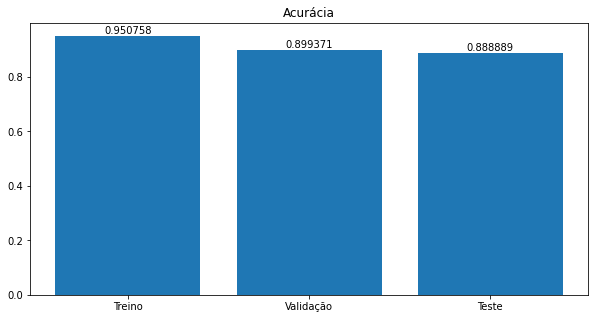

In [28]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title("Acurácia")
sets = ['Treino', 'Validação', 'Teste']
values = [train_accuracy, vali_accuracy, test_accuracy]
bar = ax.bar(sets, values)
ax.bar_label(bar)